Descargamos las librerias.

In [3]:
import numpy as np
import pandas as pd

from matplotlib.ticker import FuncFormatter
import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline

from datetime import datetime
from numpy.random import multivariate_normal
import yfinance as yf

import scipy.stats as scs
import scipy.optimize as sco
import scipy.interpolate as sci
from scipy.stats import gaussian_kde

import statsmodels.api as sm

import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff

import seaborn as sns

#import functions as f 

import random
random.seed(1000)

## ETFs

**Energía  (XLE)** – Extracción de petróleo, gas natural, así como la producción o refinamiento de combustibles o la producción de equipamiento para este fin (ejemplo: Exxon Mobil Corp, XOM).

**Materias primas  (XLB)** – Minería en todas sus variantes, así como la producción de productos químicos, fertilizantes, madera, etc. (ejemplo: Sherwin-Williams, SHW).

**Industrial (XLI)** – Producción de bienes de capital, industria aeroespacial y defensa, así como empresas dedicadas a todo tipo de transporte de cargas (ejemplo: Boeing, BA).

**Consumo discrecional (XLY)** – Automóviles, vestimenta, hoteles, restaurantes, así como las plataformas dedicadas a la venta de estos productos (ejemplo: Amazon, AMZN).

**Consumo básico (XLP)** – Consumo personal, alimentos, bebidas, tabaco, etc. (ejemplo: Coca-Cola, KO).

**Salud (XLV)** – Empresas farmacéuticas, así como productoras de cualquier tipo de equipamiento destinado a la prestación de servicios de salud (ejemplo: Pfizer, PFE).

**Financiero (XLF)** – Bancos, brókers, empresas de seguros y todo tipo de empresas involucradas en la intermediación de valores (ejemplo: JPMorgan & Chase, JPM).

**Tecnologías de la información (XLK)** – Producción de software, aplicaciones, y también hardware, semiconductores y equipamiento (ejemplo: Apple, AAPL).

**Comunicaciones (XLC)** – Telefonía, medios y entretenimiento, incluyendo publicidad, películas y redes sociales (ejemplo: Facebook, FB).

**Servicios públicos (XLU)** – Electricidad, gas por cañerías, agua potable, etc. (ejemplo: NextEra Energy, NEE).

**Inmobiliario (XLRE)** – Gestión y compraventa de propiedades inmobiliarias, incluyendo fondos dedicados a inversiones en este tipo de bienes (REIT) (ejemplo: American Tower Corporation, AMT).


In [4]:
tickers_etfs =['XLE','XLB','XLI','XLY','XLP','XLV','XLF','XLK','XLC','XLU','XLRE']
data = pd.DataFrame(columns=tickers_etfs)
data

,XLE,XLB,XLI,XLY,XLP,XLV,XLF,XLK,XLC,XLU,XLRE


Descargamos los precios de los ultimos diez años de Yahoo Finance. 

In [5]:
for ticker in tickers_etfs:
    data[ticker] = yf.download(ticker, period='10y')['Adj Close']

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


In [6]:
# Renombramos los ETFs

tickers_labels = ['Energía','Materias Primas','Industrial',
                  'Consumo Discrecional','Consumo Básico','Salud','Financiero',
                  'Tecnologías de la Inofrmación', 'Comunicaciones','Servicios Públicos','Inmobiliario']

data.columns = tickers_labels
data

,Energía,Materias Primas,Industrial,Consumo Discrecional,Consumo Básico,Salud,Financiero,Tecnologías de la Inofrmación,Comunicaciones,Servicios Públicos,Inmobiliario
Date,,,,,,,,,,,
2011-03-10,53.625515,30.318998,29.525009,33.661873,22.645874,27.403028,11.073345,21.869993,NaN,22.680517,NaN
2011-03-11,54.555222,30.765354,29.875340,33.870262,22.661114,27.495518,11.147479,21.955086,NaN,22.729450,NaN
2011-03-14,54.853016,30.651728,29.622787,33.453503,22.501055,27.360983,11.046386,21.852970,NaN,22.428896,NaN
2011-03-15,54.439014,30.651728,29.345785,33.175671,22.302872,27.041464,10.918330,21.529598,NaN,22.002544,NaN
2011-03-16,53.567398,30.034967,28.799929,32.611305,21.982735,26.570595,10.716139,21.001999,NaN,21.660070,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-04,51.040001,73.620003,91.279999,155.830002,63.299999,110.800003,33.080002,126.559998,71.690002,58.720001,36.419998
2021-03-05,52.950001,75.309998,93.440002,156.820007,64.699997,113.019997,33.709999,128.949997,73.370003,59.680000,36.840000
2021-03-08,53.049999,76.320000,94.419998,157.009995,64.980003,112.739998,34.139999,125.830002,72.389999,60.520000,37.020000


In [7]:
# Exponemos las cotizaciones graficamente.

fig = px.line(data)
fig.update_layout( title= "Cotizaciones de los ETFs sectoriales de los ultimos 10 años",
            xaxis_title="Fecha",
            yaxis_title="Precio",
            font=dict(
                family="Arial, monospace",
                size=12,
                color="black"
            ))
fig.show()

In [8]:
# Dado que las series de tiempo comienzan con valores absolutos diferentes, podemos normalizarlas a un valor inicial de 100: 
data/ data.iloc[0] * 100

,Energía,Materias Primas,Industrial,Consumo Discrecional,Consumo Básico,Salud,Financiero,Tecnologías de la Inofrmación,Comunicaciones,Servicios Públicos,Inmobiliario
Date,,,,,,,,,,,
2011-03-10,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,NaN,100.000000,NaN
2011-03-11,101.733702,101.472198,101.186555,100.619066,100.067296,100.337515,100.669480,100.389084,NaN,100.215749,NaN
2011-03-14,102.289024,101.097429,100.331171,99.380990,99.360505,99.846566,99.756538,99.922162,NaN,98.890584,NaN
2011-03-15,101.517001,101.097429,99.392976,98.555629,98.485365,98.680567,98.600107,98.443552,NaN,97.010770,NaN
2011-03-16,99.891625,99.063192,97.544182,96.879058,97.071699,96.962257,96.774179,96.031118,NaN,95.500778,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-04,95.178575,242.818057,309.161627,462.927308,279.521114,404.334883,298.735398,578.692441,NaN,258.900627,NaN
2021-03-05,98.740312,248.392103,316.477472,465.868337,285.703245,412.436154,304.424711,589.620654,NaN,263.133331,NaN
2021-03-08,98.926787,251.723355,319.796677,466.432736,286.939702,411.414373,308.307913,575.354554,NaN,266.836951,NaN


In [9]:
fig = px.line(data/ data.iloc[0] * 100)
fig.update_layout( title= "Rendimiento de los ETFs sectoriales de los ultimos 10 años",
            xaxis_title="Fecha",
            yaxis_title="Valor",
            font=dict(
                family="Arial, monospace",
                size=12,
                color="black"
            ))
fig.show()

In [10]:
# Calculamos los rendimientos
ret_etfs = np.log(data / data.shift(1)).round(4).dropna(how='all')
ret_etfs

,Energía,Materias Primas,Industrial,Consumo Discrecional,Consumo Básico,Salud,Financiero,Tecnologías de la Inofrmación,Comunicaciones,Servicios Públicos,Inmobiliario
Date,,,,,,,,,,,
2011-03-11,0.0172,0.0146,0.0118,0.0062,0.0007,0.0034,0.0067,0.0039,NaN,0.0022,NaN
2011-03-14,0.0054,-0.0037,-0.0085,-0.0124,-0.0071,-0.0049,-0.0091,-0.0047,NaN,-0.0133,NaN
2011-03-15,-0.0076,0.0000,-0.0094,-0.0083,-0.0088,-0.0117,-0.0117,-0.0149,NaN,-0.0192,NaN
2011-03-16,-0.0161,-0.0203,-0.0188,-0.0172,-0.0145,-0.0176,-0.0187,-0.0248,NaN,-0.0157,NaN
2011-03-17,0.0301,0.0177,0.0154,0.0045,0.0048,0.0116,0.0119,0.0105,NaN,0.0013,NaN
...,...,...,...,...,...,...,...,...,...,...,...
2021-03-04,0.0236,-0.0196,-0.0161,-0.0214,-0.0036,-0.0135,-0.0114,-0.0223,-0.0018,-0.0009,-0.0074
2021-03-05,0.0367,0.0227,0.0234,0.0063,0.0219,0.0198,0.0189,0.0187,0.0232,0.0162,0.0115
2021-03-08,0.0019,0.0133,0.0104,0.0012,0.0043,-0.0025,0.0127,-0.0245,-0.0134,0.0140,0.0049


In [11]:
ret_etfs.columns

Index(['Energía', 'Materias Primas', 'Industrial', 'Consumo Discrecional',
       'Consumo Básico', 'Salud', 'Financiero',
       'Tecnologías de la Inofrmación', 'Comunicaciones', 'Servicios Públicos',
       'Inmobiliario'],
      dtype='object')

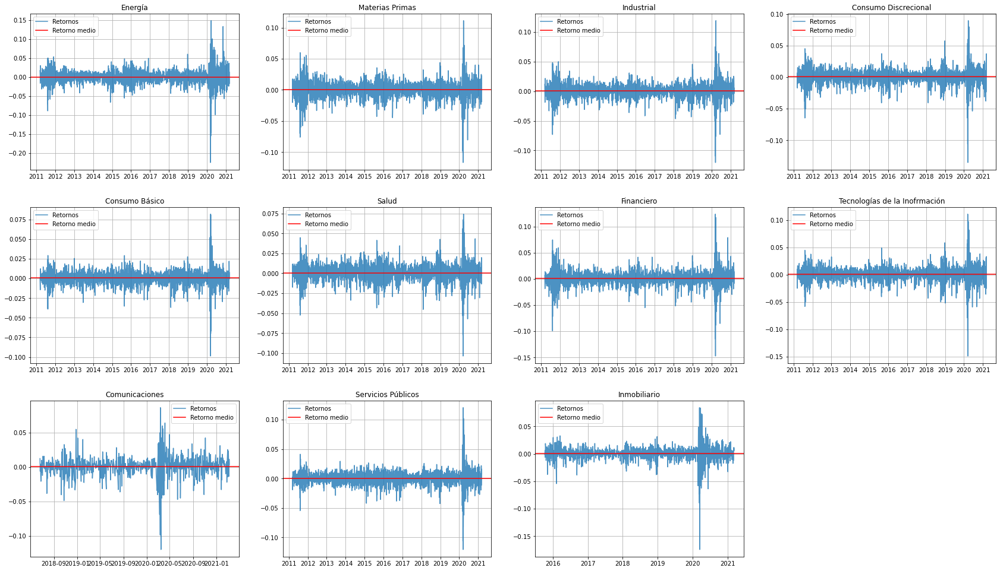

In [12]:
# Presentamos graficamente
fig = plt.figure(figsize = (24,14))
for i in range(len(ret_etfs.columns)):
    plt.subplot(3,4,i+1)
    plt.plot(ret_etfs[ret_etfs.columns[i]], label = 'Retornos', alpha = 0.8)
    plt.axhline(ret_etfs[ret_etfs.columns[i]].mean(), label = 'Retorno medio', color= 'red')
    plt.legend(loc = 'best')
    plt.title(ret_etfs.columns[i])
    plt.grid(True)
plt.tight_layout(pad=3.0)

C:\Users\maxip\anaconda3\lib\site-packages\numpy\lib\histograms.py:839: RuntimeWarning:

invalid value encountered in greater_equal

C:\Users\maxip\anaconda3\lib\site-packages\numpy\lib\histograms.py:840: RuntimeWarning:

invalid value encountered in less_equal



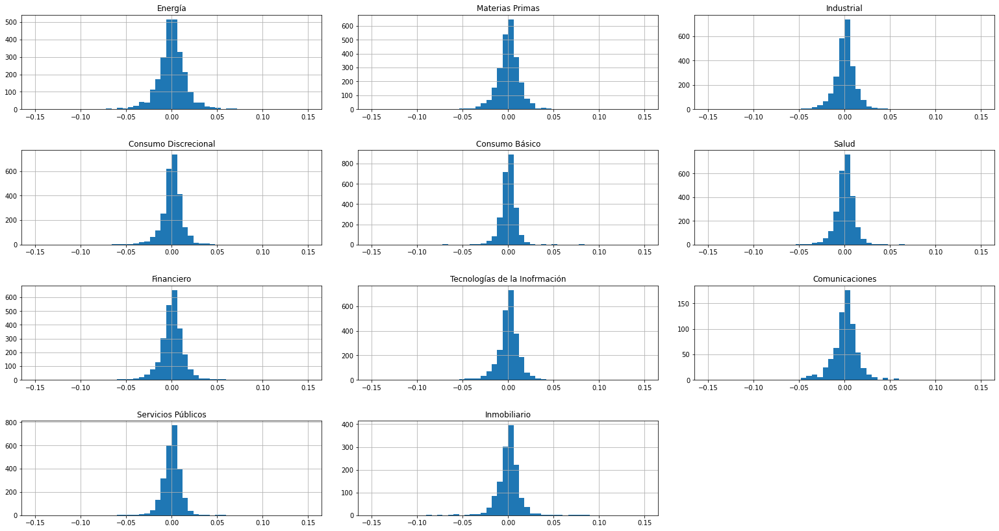

In [13]:
# Presentamos la distribución de los rendmientos

fig = plt.figure(figsize = (22,12))
for i in range(len(ret_etfs.columns)):
    plt.subplot(4,3,i+1)
    plt.hist(ret_etfs[ret_etfs.columns[i]], bins = 50, range = (-0.15, 0.15))
    plt.title(ret_etfs.columns[i])
    plt.grid(True)
plt.tight_layout(pad=3.0)

In [14]:
# Calculamos Rendimientos y Covarianzas anuales:

ret_anuales = ret_etfs.mean() * 252
cov_anuales = ret_etfs.cov() * 252

In [15]:
ret_anuales

Energía                         -0.001442
Materias Primas                  0.094200
Industrial                       0.116455
Consumo Discrecional             0.158842
Consumo Básico                   0.106239
Salud                            0.143157
Financiero                       0.113110
Tecnologías de la Inofrmación    0.178974
Comunicaciones                   0.150501
Servicios Públicos               0.100580
Inmobiliario                     0.075323
dtype: float64

In [16]:
cov_anuales

,Energía,Materias Primas,Industrial,Consumo Discrecional,Consumo Básico,Salud,Financiero,Tecnologías de la Inofrmación,Comunicaciones,Servicios Públicos,Inmobiliario
Energía,0.080637,0.047466,0.044785,0.035532,0.021912,0.029266,0.050144,0.036270,0.062366,0.022777,0.038146
Materias Primas,0.047466,0.045639,0.038781,0.032356,0.020712,0.027080,0.041412,0.033751,0.049961,0.020550,0.031904
Industrial,0.044785,0.038781,0.041079,0.032285,0.020918,0.026957,0.041687,0.033377,0.051842,0.020734,0.032944
Consumo Discrecional,0.035532,0.032356,0.032285,0.034504,0.019205,0.024974,0.034958,0.033433,0.055224,0.017832,0.029832
Consumo Básico,0.021912,0.020712,0.020918,0.019205,0.020375,0.018312,0.022432,0.020610,0.033864,0.018722,0.025431
Salud,0.029266,0.027080,0.026957,0.024974,0.018312,0.029364,0.029544,0.027597,0.042942,0.017690,0.026051
Financiero,0.050144,0.041412,0.041687,0.034958,0.022432,0.029544,0.053576,0.035646,0.056053,0.021959,0.035540
Tecnologías de la Inofrmación,0.036270,0.033751,0.033377,0.033433,0.020610,0.027597,0.035646,0.042592,0.067568,0.019016,0.032343
Comunicaciones,0.062366,0.049961,0.051842,0.055224,0.033864,0.042942,0.056053,0.067568,0.063784,0.035489,0.045006
Servicios Públicos,0.022777,0.020550,0.020734,0.017832,0.018722,0.017690,0.021959,0.019016,0.035489,0.032384,0.034920


In [17]:
# Matriz de Correlaciones
corr_matriz = ret_etfs.corr()
corr_matriz

,Energía,Materias Primas,Industrial,Consumo Discrecional,Consumo Básico,Salud,Financiero,Tecnologías de la Inofrmación,Comunicaciones,Servicios Públicos,Inmobiliario
Energía,1.000000,0.782435,0.778134,0.673622,0.540604,0.601440,0.762907,0.618891,0.598062,0.445717,0.533952
Materias Primas,0.782435,1.000000,0.895649,0.815364,0.679221,0.739723,0.837477,0.765501,0.727007,0.534539,0.655023
Industrial,0.778134,0.895649,1.000000,0.857553,0.723060,0.776178,0.888596,0.797947,0.739926,0.568474,0.687817
Consumo Discrecional,0.673622,0.815364,0.857553,1.000000,0.724334,0.784585,0.813065,0.872118,0.874024,0.533469,0.682388
Consumo Básico,0.540604,0.679221,0.723060,0.724334,1.000000,0.748655,0.678945,0.699637,0.690949,0.728856,0.730912
Salud,0.601440,0.739723,0.776178,0.784585,0.748655,1.000000,0.744879,0.780354,0.775444,0.573659,0.647864
Financiero,0.762907,0.837477,0.888596,0.813065,0.678945,0.744879,1.000000,0.746219,0.717594,0.527177,0.650077
Tecnologías de la Inofrmación,0.618891,0.765501,0.797947,0.872118,0.699637,0.780354,0.746219,1.000000,0.897698,0.512028,0.626605
Comunicaciones,0.598062,0.727007,0.739926,0.874024,0.690949,0.775444,0.717594,0.897698,1.000000,0.545184,0.656574
Servicios Públicos,0.445717,0.534539,0.568474,0.533469,0.728856,0.573659,0.527177,0.512028,0.545184,1.000000,0.773387


Definimos : Retorno del Portafolio / Riesgo del Portafolio

In [18]:
def portf_media(w, media):
    mu = w.dot(media) #Definimos a mu como una mutiplicación de matrices
    return mu
    
def portf_var(w, cov_matriz):
    sigma2 = np.diagonal(w.dot(cov_matriz).dot(w.T)) # Definimos sigma cuadrado como = Los elementos diagonales de (Multiplicación de matrices) 
    return sigma2   # Sigma2= diagonal de varianzas

def rand_weights(n):
    k = np.random.rand(n)
    return k / sum(k)    #Definimos la funcion de pesos aleatorios

In [19]:
nde = len(tickers_labels) # nde= Número de ETFs
weights = np.zeros((10000,nde)) # Armamos una matriz de 10.000 filas x 11 columnas
for i in range(len(weights)):
    weights[i] = rand_weights(nde) # Generamos los pesos aleatorios en cada elemento de la matriz
weights

array([[0.01279195, 0.0525208 , 0.10687002, ..., 0.10208169, 0.04103114,
        0.06710765],
       [0.1629692 , 0.12806233, 0.02392107, ..., 0.0805439 , 0.05289763,
        0.0963219 ],
       [0.15647476, 0.0121134 , 0.05748931, ..., 0.113956  , 0.10898095,
        0.06124663],
       ...,
       [0.20467652, 0.12522314, 0.13429338, ..., 0.00777795, 0.10730885,
        0.08533316],
       [0.09107406, 0.02946061, 0.03613381, ..., 0.12238308, 0.04032501,
        0.13401193],
       [0.09179456, 0.19730743, 0.09140863, ..., 0.16049068, 0.02087399,
        0.04161315]])

In [20]:
# Reemplazamos las entradas de las funciones de Retorno y Riesgo definidas
pret= portf_media(weights, ret_anuales)
pvol = np.sqrt(portf_var(weights, cov_anuales))

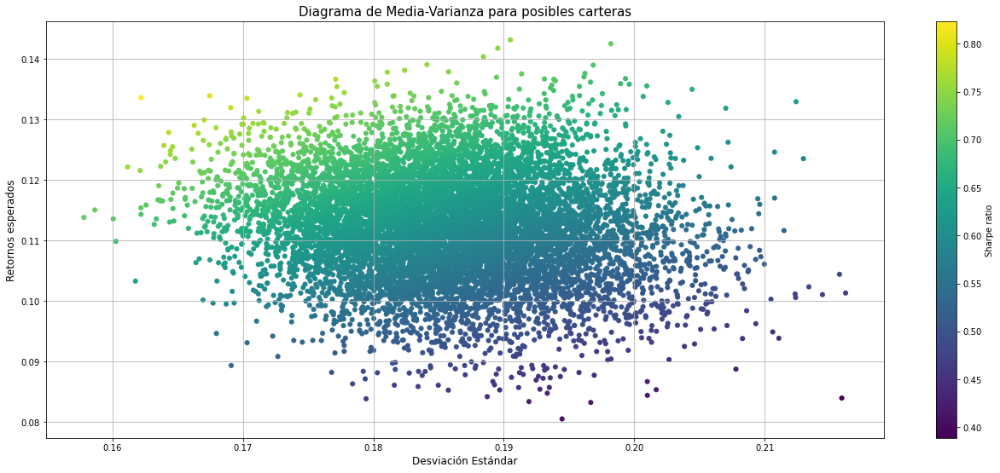

In [21]:
fig = plt.figure(figsize = (22,9))          
plt.scatter(pvol, pret, marker= 'o', lw = 0.1, c = pret/pvol) # c = lista/escala de colores; definimos en c el ratio de Sharpe
plt.grid(True)
plt.title('Diagrama de Media-Varianza para posibles carteras', fontsize = 15)
plt.xlabel('Desviación Estándar', fontsize = 12)
plt.ylabel('Retornos esperados', fontsize = 12)
plt.colorbar(label = 'Sharpe ratio')

In [22]:
def estadísticas(weights):
    '''
    Esta funcion nos devuelve el retorno medio (pret), la desviacion estandard (pvol) y Sharpe ratio del portafolio (pret/pvol)
    con determinados pesos en cada activo.
    '''
    
    weights = np.array(weights) 
    pret = np.sum(ret_anuales * weights) # Sumaria los retornos anuales* pesos aleatorios(11) en cada una de las 10.000 filas
    pvol = np.sqrt(np.dot(weights.T, np.dot(cov_anuales, weights)))
    
    return np.array([pret, pvol, pret / pvol])

In [23]:
def min_func_sharpe(weights):    
    '''
    Esta funcion nos devuelve el negativo del Sharpe ratio. Por qué negativo? Porque vamos a usar la función 'minimize', 
     y como queremos maximizar el ratio, tambien podemos minimizar su opuesto.
    '''
    return -estadísticas(weights)[2]

In [24]:
# Definimos la restriccion = pesos aleatorios deben sumar 1

restric = ({'type': 'eq', 'fun': lambda x:  np.sum(x) - 1})  #La restricción de igualdad significa que el resultado de la función de restricción debe ser cero, mientras que la desigualdad significa que no debe ser negativo.

In [25]:
# Definimos lo Limites : entre 0 y 1
tuple((0, 1) for x in range(nde))

((0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1),
 (0, 1))

In [26]:
límites = tuple((0, 1) for x in range(nde))

In [27]:
'''
La funcion minimize tiene como argumento: 
    *la funcion a minimizar, 
    *un vector de estimación (suposición) inicial, / suponer que se invierte la misma cantidad en todos los ETFs
    *el algoritmo optimizador, 
    *los limites de las variables, y 
    *las restricciones de la optimizacion 

Buscamos el portafolio con maximo Sharpe ratio
'''

opts = sco.minimize(min_func_sharpe, nde * [1. / nde], method='SLSQP',bounds=límites, constraints=restric) 

print(opts)

     fun: -0.9141244389308671
     jac: array([ 1.04870446e+00,  4.00357887e-01,  2.62907214e-01, -1.07340515e-04,
        4.99151647e-04,  4.00468707e-04,  3.59467141e-01, -5.02727926e-04,
        8.09611179e-01,  1.63547695e-04,  4.92966563e-01])
 message: 'Optimization terminated successfully'
    nfev: 96
     nit: 8
    njev: 8
  status: 0
 success: True
       x: array([0.        , 0.        , 0.        , 0.23578645, 0.12003811,
       0.31066093, 0.        , 0.32053801, 0.        , 0.0129765 ,
       0.        ])


In [28]:
opt_weights = pd.DataFrame(columns = ['Max Sharpe Ratio'], index= tickers_labels)
opt_weights['Max Sharpe Ratio'] = opts['x'].round(3)
opt_weights

,Max Sharpe Ratio
Energía,0.000
Materias Primas,0.000
Industrial,0.000
Consumo Discrecional,0.236
Consumo Básico,0.120
Salud,0.311
Financiero,0.000
Tecnologías de la Inofrmación,0.321
Comunicaciones,0.000
Servicios Públicos,0.013


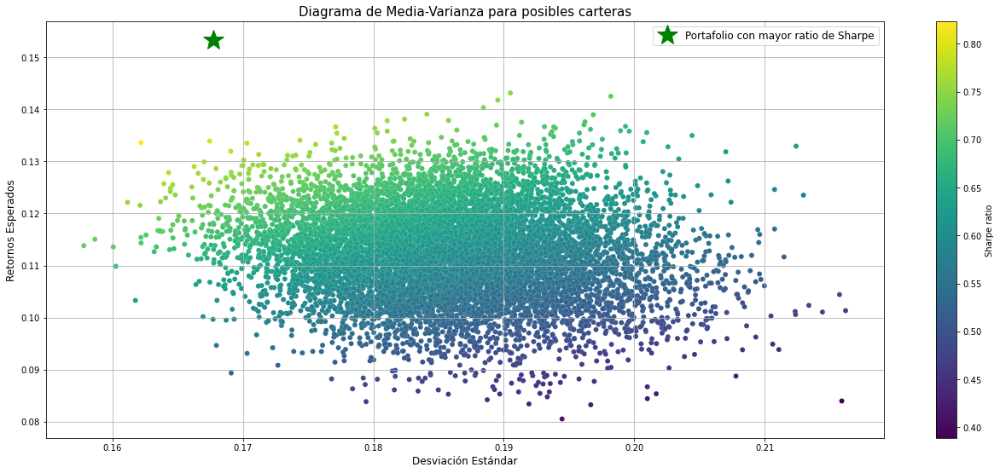

In [29]:
plt.figure(figsize=(22,9))

# composicion aleatoria de la cartera
plt.scatter(pvol, pret, marker= 'o', lw = 0.1, c = pret/pvol, edgecolors='w')

# cartera con el mayor ratio de Sharpe

plt.plot(estadísticas(opts['x'])[1], estadísticas(opts['x'])[0],'g*', markersize=25.0, label='Portafolio con mayor ratio de Sharpe')


plt.grid(True)
plt.title('Diagrama de Media-Varianza para posibles carteras', fontsize = 15)
plt.xlabel('Desviación Estándar', fontsize = 12)
plt.ylabel('Retornos Esperados', fontsize = 12)
plt.colorbar(label='Sharpe ratio')
plt.legend(fontsize=12, loc = 'best')

In [30]:
def min_func_varianza(weights):   
    '''
    Esta funcion nos devuelve la varianza
    
    '''
    return estadísticas(weights)[1]**2

In [31]:
# buscamos el portafolio con mínima varianza

optv = sco.minimize(min_func_varianza, nde * [1. / nde,],method='SLSQP', bounds=límites,constraints=restric)
opt_weights['Min Varianza'] = optv['x'].round(3)
opt_weights

,Max Sharpe Ratio,Min Varianza
Energía,0.000,0.000
Materias Primas,0.000,0.000
Industrial,0.000,0.000
Consumo Discrecional,0.236,0.000
Consumo Básico,0.120,0.741
Salud,0.311,0.168
Financiero,0.000,0.000
Tecnologías de la Inofrmación,0.321,0.000
Comunicaciones,0.000,0.000
Servicios Públicos,0.013,0.092


In [32]:
# Armamos un portafolio ingenuo, con igual peso en los 11 ETFs

w = np.array(nde * [1. / nde])

print(np.sum(w))


naive_ret = np.sum(ret_etfs.mean() * w) * 252


naive_vol = np.sqrt(np.dot(w.T, np.dot(ret_etfs.cov() * 252, w)))

1.0


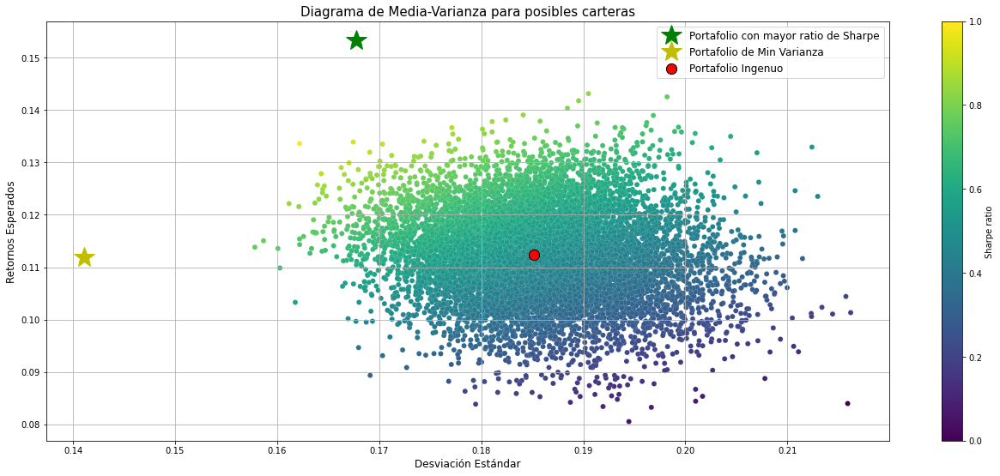

In [33]:
plt.figure(figsize=(22,9))

# composicion aleatoria de portafolios
plt.scatter(pvol, pret, marker= 'o', lw = 0.1, c = pret/pvol, edgecolors='w')

# cartera con el mayor ratio de Sharpe

plt.plot(estadísticas(opts['x'])[1], estadísticas(opts['x'])[0],'g*', markersize=25.0, label='Portafolio con mayor ratio de Sharpe')

# portafolio de min varianza
plt.plot(estadísticas(optv['x'])[1], estadísticas(optv['x'])[0],'y*', markersize=25.0, label='Portafolio de Min Varianza')


plt.scatter(naive_vol, naive_ret, c='red', s=150, marker='o',label='Portafolio Ingenuo', edgecolors='black')


plt.grid(True)
plt.title('Diagrama de Media-Varianza para posibles carteras', fontsize = 15)
plt.xlabel('Desviación Estándar', fontsize = 12)
plt.ylabel('Retornos Esperados', fontsize = 12)
plt.colorbar(label='Sharpe ratio')
plt.legend(fontsize=12, loc = 'best')

Estimamos la Frontera Eficiente

In [34]:
restric1 = {'type': 'eq', 'fun': lambda x:  estadísticas(x)[0] - fe_rets}
restric2 = {'type': 'eq', 'fun': lambda x:  np.sum(x) - 1}
límites = tuple((0, 1) for x in range(nde))

def min_func_port(w):
    '''
    Devuelve la desviacion estandar
    '''  
    return estadísticas(w)[1]

In [39]:
#En el diagrama volatilidad - retornos esperados, fe_rets seria el eje vertical. 
#Para cada valor de retorno esperado, queremos hallar la minima volatilidad.

fe_rets = np.linspace(0.0025, 0.178974, 100) #generamos 100 rendimientos aleatorios entre los limites: 0,0025-ret_anual de tec. infor.
fe_vols = []

fe_we = []

'''
Llevamos a cabo la minimizacion reiteradas veces, para cada valor en fe_rets, buscamos la mínima varianza. 
    fe_vols guarda la minima volatilidad para cada fe_ret
    fe_we guarda los weights optimos para cada par (fe_ret, fe_vol)
'''

for fe_ret in fe_rets:
    restricciones = ({'type': 'eq', 'fun': lambda x:  estadísticas(x)[0] - fe_ret}, {'type': 'eq', 'fun': lambda x:  np.sum(x) - 1})
    valores = sco.minimize(min_func_port, nde * [1. / nde,], method='SLSQP',  bounds=límites, constraints=restricciones)
    fe_vols.append(valores['fun'])
    fe_we.append(valores['x'].round(3))
       
fe_vols = np.array(fe_vols)

ind = np.argmin(fe_vols) # Solo nos importa la parte eficiente de la frontera (cortamos a partir de la min volatilidad en adelante)
fe_vols = fe_vols[ind:]
fe_rets = fe_rets[ind:]

In [40]:
fe_w = pd.DataFrame(fe_we,columns=tickers_labels)
fe_w

,Energía,Materias Primas,Industrial,Consumo Discrecional,Consumo Básico,Salud,Financiero,Tecnologías de la Inofrmación,Comunicaciones,Servicios Públicos,Inmobiliario
0,0.961,0.0,0.0,0.000,0.0,0.000,0.0,0.000,0.0,0.039,0.0
1,0.944,0.0,0.0,0.000,0.0,0.000,0.0,0.000,0.0,0.056,0.0
2,0.926,0.0,0.0,0.000,0.0,0.000,0.0,0.000,0.0,0.074,0.0
3,0.909,0.0,0.0,0.000,0.0,0.000,0.0,0.000,0.0,0.091,0.0
4,0.891,0.0,0.0,0.000,0.0,0.000,0.0,0.000,0.0,0.109,0.0
...,...,...,...,...,...,...,...,...,...,...,...
95,0.000,0.0,0.0,0.159,0.0,0.109,0.0,0.731,0.0,0.000,0.0
96,0.000,0.0,0.0,0.142,0.0,0.069,0.0,0.789,0.0,0.000,0.0
97,0.000,0.0,0.0,0.124,0.0,0.030,0.0,0.846,0.0,0.000,0.0
98,0.000,0.0,0.0,0.089,0.0,0.000,0.0,0.911,0.0,0.000,0.0


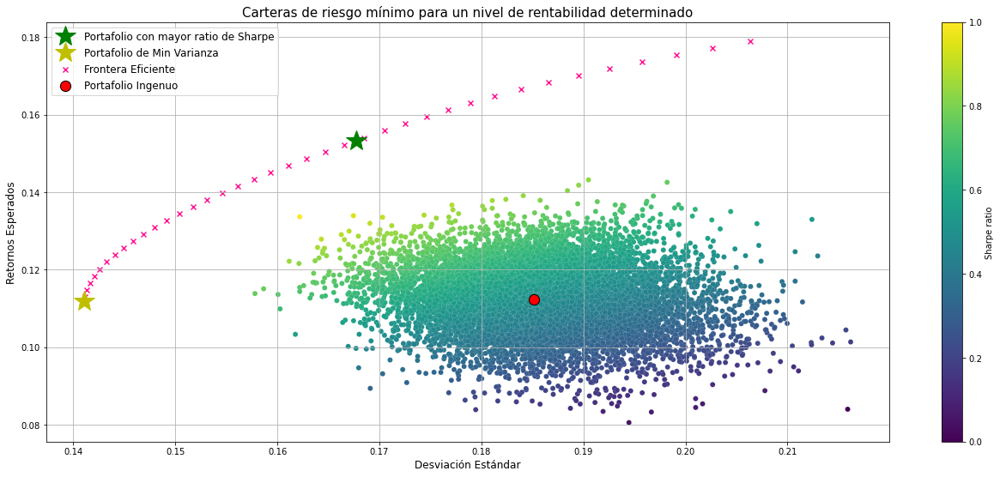

In [41]:
plt.figure(figsize=(22,9))

# compasicion aleatoria de portafolios
plt.scatter(pvol, pret, marker= 'o', lw = 0.1, c = pret/pvol, edgecolors='w')

# frontera eficiente
plt.scatter(fe_vols, fe_rets, c = 'deeppink', marker='x', label='Frontera Eficiente', edgecolors='black')

# cartera con el mayor ratio de Sharpe

plt.plot(estadísticas(opts['x'])[1], estadísticas(opts['x'])[0],'g*', markersize=25.0, label='Portafolio con mayor ratio de Sharpe')

# portafolio de min varianza
plt.plot(estadísticas(optv['x'])[1], estadísticas(optv['x'])[0],'y*', markersize=25.0, label='Portafolio de Min Varianza')

plt.scatter(naive_vol, naive_ret, c='red', s=150, marker='o',label='Portafolio Ingenuo', edgecolors='black')


plt.grid(True)
plt.title('Carteras de riesgo mínimo para un nivel de rentabilidad determinado', fontsize = 15)
plt.xlabel('Desviación Estándar', fontsize = 12)
plt.ylabel('Retornos Esperados', fontsize = 12)
plt.colorbar(label='Sharpe ratio')
plt.legend(fontsize=12, loc = 'best')